In [5]:
pip install pyzbar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
!apt-get install libzbar0

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libzbar0 is already the newest version (0.23-1.3).
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 27 not upgraded.


In [7]:
# Importing needed libraries
import matplotlib.pyplot as plt
from pyzbar.pyzbar import decode
import cv2
import torch
import os
import PIL
import numpy as np
from google.colab.patches import cv2_imshow
from collections import Counter

In [4]:
# Mounting Drive to colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
# unzipping folder that contains trained model for detecting objects
!unzip -q exp6.zip -d ../content

In [13]:
# loading trained model in this script
model = torch.hub.load('ultralytics/yolov5', 'custom', path='exp6/weights/last.pt', force_reload=True)
model2 = torch.hub.load('ultralytics/yolov5', 'custom', path='exp13/weights/last.pt', force_reload=True)

/usr/local/lib/python3.8/dist-packages/torch/hub.py:267: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
requirements: YOLOv5 requirements "gitpython" "ipython" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB

{'8901725114916': 2, '8901063160088': 2, '8901030578199': 1}






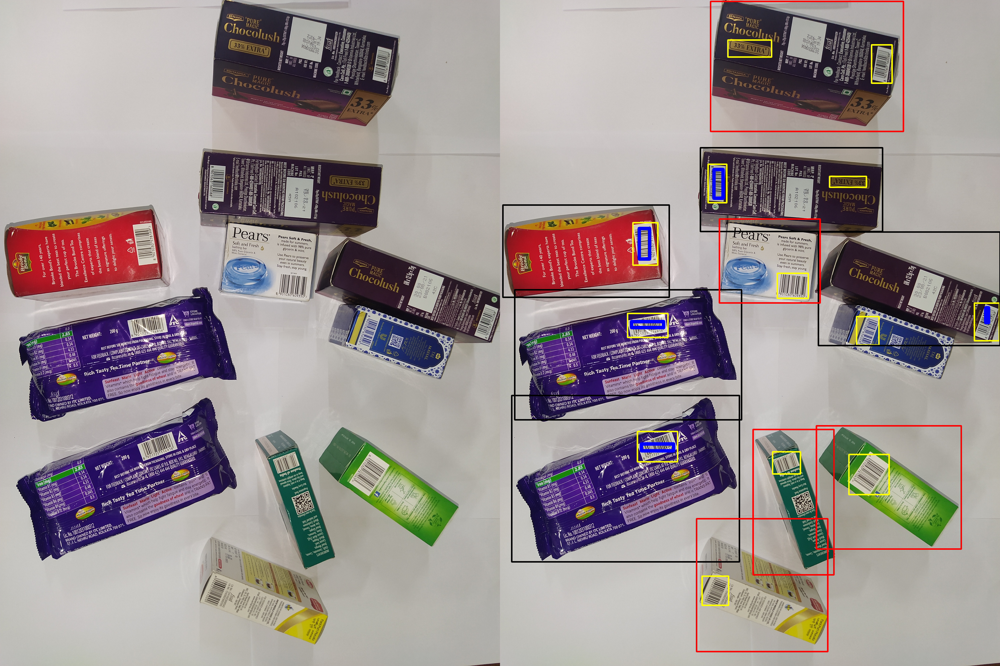

In [56]:
# Grabbing the Img for detection
im = cv2.imread('drive/MyDrive/Mowito/partial-barcode/1.jpg')
# convert into RGB format
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
input = im.copy()

# An empty list for grabbing barcode appearance
nobar = []

# getting results from the model
results = model(im)

# this for loop will run as same number as number of objects detected
for i in range(np.shape(results.xyxy[0])[0]):

  # cropping image in different objects
  roi = im[int(results.xyxy[0][i][1].item()):int(results.xyxy[0][i][3].item()), (int(results.xyxy[0][i][0].item())):(int(results.xyxy[0][i][2].item()))]
  
  # adding bbox of red color on all objs
  cv2.rectangle(im, (int(results.xyxy[0][i][0].item()), int(results.xyxy[0][i][1].item())), (int(results.xyxy[0][i][2].item()), int(results.xyxy[0][i][3].item())), (255,0,0), 8)

  # running model2 for barcode detection
  results2 = model2(roi)

  # this loop will run as same number as barcode detected by yolo in roi
  for k in range(np.shape(results2.xyxy[0])[0]):
    # getting coordinated for every detected barcodes
    x1 = int(results2.xyxy[0][k][0].item()) + int(results.xyxy[0][i][0].item())
    y1 = int(results2.xyxy[0][k][1].item()) + int(results.xyxy[0][i][1].item())
    x2 = int(results2.xyxy[0][k][2].item()) + int(results.xyxy[0][i][0].item())
    y2 = int(results2.xyxy[0][k][3].item()) + int(results.xyxy[0][i][1].item())
    cv2.rectangle(im, (x1, y1), (x2, y2),  (255,255,0), 8)

  # this for loop will run if object has any barcode or QR code (as pyzbar scans both)
  for bar in decode(roi):
    # if detected was barcode then will override red bbox to black bbox
    if (bar.type == 'EAN13'):
      cv2.rectangle(im, (int(results.xyxy[0][i][0].item()), int(results.xyxy[0][i][1].item())), (int(results.xyxy[0][i][2].item()), int(results.xyxy[0][i][3].item())), (0,0,0), 8)
  
  # this for loop detects barcode and makes it separated rectangular bbox (pyzbar gives polygon and it merges 2 same bbox)
  for barcode in decode(roi):
    if (barcode.type == 'EAN13'):

      # collecting number in list
      myData = barcode.data.decode('utf-8')
      nobar.append(myData)

      # this will find left top and bottom right point of box
      highest = list(barcode.polygon[0])
      lowest = list(barcode.polygon[0])
      
      for j in range(int(np.size(barcode.polygon)/2)):
        if (lowest[0]>barcode.polygon[0+j][0]):
          lowest[0] = barcode.polygon[0+j][0]
        if(lowest[1]>barcode.polygon[0+j][1]):
          lowest[1] = barcode.polygon[0+j][1]
        if (highest[0]<barcode.polygon[0+j][0]):
          highest[0] = barcode.polygon[0+j][0]
        if(highest[1]<barcode.polygon[0+j][1]):
          highest[1] = barcode.polygon[0+j][1]

      lowest[0] = lowest[0] + int(results.xyxy[0][i][0].item())
      lowest[1] = lowest[1] + int(results.xyxy[0][i][1].item())
      highest[0] = highest[0] + int(results.xyxy[0][i][0].item())
      highest[1] = highest[1] + int(results.xyxy[0][i][1].item())

      tuple(lowest)
      tuple(highest)
      cv2.rectangle(im, lowest, highest, (0, 0, 255), 20)

# will calculate and print barcode number and repetition
counts = dict(Counter(nobar))
duplicates = {key:value for key, value in counts.items() if value >= 1}
print(duplicates)
print('\n\n\n')

# showing img
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
input = cv2.cvtColor(input, cv2.COLOR_BGR2RGB)

# concating two images
output = cv2.hconcat([input, im])

cv2_imshow(output)